# Telecom Churn Prediction - Khang_Yasavi

In [10]:
#Data Structures
import pandas as pd
import numpy as np
import re
# import os

#Sklearn
# from sklearn.impute import SimpleImputer
# from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
# from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, precision_score, recall_score
#Plotting
import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

#Others
import warnings
warnings.filterwarnings('ignore')

# %matplotlib inline

In [11]:
# import data

data = pd.read_csv("train.csv")
unseen = pd.read_csv("test.csv")
data_dict = pd.read_csv("data_dictionary.csv")

print(data.shape)
print(unseen.shape)
print(data_dict.shape)

(69999, 172)
(30000, 171)
(36, 2)


In [12]:
# View data dictionary
data_dict.style

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belongs to
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile to mobile
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


# Data Preprocessing

## Drop duplicates

In [13]:
# drop duplicated columns
print ('Before drop dublicated columns: ', data.shape)
data = data.loc[:,~data.columns.duplicated()]
print ('After drop dublicated columns: ', data.shape)

Before drop dublicated columns:  (69999, 172)
After drop dublicated columns:  (69999, 172)


In [14]:
# drop duplicated rows
print ('before drop dublicated rows: ', data.shape)
data.drop_duplicates(inplace=True)
print ('after drop dublicated rows: ', data.shape)

before drop dublicated rows:  (69999, 172)
after drop dublicated rows:  (69999, 172)


## Drop Columns


### Define custom info function

In [15]:
# display columns with the highest number of missing values 

def more_info(dt):
    zeros_data = pd.DataFrame(dt.isin([0]).mean()*100)[dt.isin([0]).mean()*100>0].rename(columns={0:'% zero values'})
    missing_data = pd.DataFrame(dt.isnull().mean()*100)[dt.isnull().mean()*100>0].rename(columns={0:'% missing values'})
    dtype_data = pd.DataFrame(dt.dtypes).rename(columns={0:'data type'})
    unique_data = pd.DataFrame(dt.nunique()).rename(columns={0:'uniques'})
    # mode_data = pd.DataFrame(dt.mode()).transpose().rename(columns={0:'mode'})
    # mode_percent = pd.DataFrame(pd.Series({i: len(data[data[i] == 0])/len(data)*100 for i in data})).rename(columns={0:'mode %'})
    info_data = pd.concat([ zeros_data, missing_data, dtype_data, unique_data], axis=1)
    return info_data

### Drop unneeded columns

In [16]:
# list all columns
print(data.columns.tolist())

['id', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_

In [17]:
# drop id column
data.drop(columns=['id'],inplace=True)

#### Analyze zero values

In [18]:
# view data info
display(more_info(data)[more_info(data)['% zero values']>0].sort_values(by='% zero values', ascending=False).head(25).style)

# # Drop columns with over 90% zero values
print ('Before dropping columns: ', data.shape)
data_info = more_info(data)
data.drop(columns=[i for i in data_info.index if data_info.loc[i,'% zero values']> 90], inplace=True)
print ('After dropping columns: ', data.shape)
 
# review data info
display(more_info(data)[more_info(data)['% zero values']>0].sort_values(by='% zero values', ascending=False).head(20))

,% zero values,% missing values,data type,uniques
loc_og_t2o_mou,98.997129,1.002871,float64,1
loc_ic_t2o_mou,98.997129,1.002871,float64,1
std_og_t2o_mou,98.997129,1.002871,float64,1
std_ic_t2o_mou_7,96.161374,3.838626,float64,1
std_og_t2c_mou_7,96.161374,3.838626,float64,1
std_ic_t2o_mou_6,96.045658,3.954342,float64,1
std_og_t2c_mou_6,96.045658,3.954342,float64,1
sachet_3g_7,95.859941,nan,int64,26
sachet_3g_6,95.841369,nan,int64,23
og_others_7,95.818512,3.838626,float64,148


Before dropping columns:  (69999, 171)
After dropping columns:  (69999, 148)


,% zero values,% missing values,data type,uniques
churn_probability,89.811283,NaN,int64,2
sachet_2g_6,87.118387,NaN,int64,30
sachet_2g_7,86.682667,NaN,int64,33
sachet_2g_8,85.926942,NaN,int64,32
spl_ic_mou_7,85.521222,3.838626,float64,103
vol_3g_mb_6,85.439792,NaN,float64,9768
std_og_t2f_mou_7,85.371220,3.838626,float64,1991
jun_vbc_3g,84.922642,NaN,float64,9617
vol_3g_mb_7,84.621209,NaN,float64,10296
std_og_t2f_mou_6,84.401206,3.954342,float64,2074


#### Analyze unique values

In [19]:
# view data info
display(more_info(data)[more_info(data)['% missing values']>0].sort_values(by='uniques').head(15))

# Drop columns with ony 1 unique value
data_info = more_info(data)
print ('Before dropping columns: ', data.shape)
data.drop(columns=[i for i in data_info.index if data_info.loc[i,'uniques'] == 1], inplace=True)
print ('After dropping columns: ', data.shape)

# review data info
display(more_info(data)[more_info(data)['% missing values']>0].sort_values(by='uniques').head(15))


,% zero values,% missing values,data type,uniques
last_date_of_month_7,NaN,0.570008,object,1
last_date_of_month_8,NaN,1.047158,object,1
night_pck_user_8,25.757511,73.689624,float64,2
fb_user_7,2.308604,74.478207,float64,2
fb_user_8,2.885756,73.689624,float64,2
night_pck_user_6,24.463207,74.902499,float64,2
fb_user_6,2.100030,74.902499,float64,2
night_pck_user_7,24.907499,74.478207,float64,2
count_rech_3g_6,15.743082,74.902499,float64,23
count_rech_3g_7,16.303090,74.478207,float64,27


Before dropping columns:  (69999, 148)
After dropping columns:  (69999, 144)


,% zero values,% missing values,data type,uniques
fb_user_7,2.308604,74.478207,float64,2
fb_user_8,2.885756,73.689624,float64,2
fb_user_6,2.100030,74.902499,float64,2
night_pck_user_8,25.757511,73.689624,float64,2
night_pck_user_7,24.907499,74.478207,float64,2
night_pck_user_6,24.463207,74.902499,float64,2
count_rech_3g_6,15.743082,74.902499,float64,23
count_rech_3g_7,16.303090,74.478207,float64,27
count_rech_3g_8,16.605952,73.689624,float64,29
date_of_last_rech_6,NaN,1.572880,object,30


#### Analyze missing values

In [20]:
# view data info
display(more_info(data)[more_info(data)['% missing values']>0].sort_values(by='% missing values', ascending=False).head(35))

# Drop columns with over 70% missing values
print ('Before dropping columns: ', data.shape)
data_info = more_info(data)
data.drop(columns=[i for i in data_info.index if data_info.loc[i,'% missing values']> 70], inplace=True)
print ('After dropping columns: ', data.shape)
 
# review data info
display(more_info(data)[more_info(data)['% missing values']>0].sort_values(by='% missing values', ascending=False).head(35))

,% zero values,% missing values,data type,uniques
arpu_2g_6,6.585808,74.902499,float64,5389
count_rech_3g_6,15.743082,74.902499,float64,23
arpu_3g_6,10.881584,74.902499,float64,5506
av_rech_amt_data_6,NaN,74.902499,float64,792
count_rech_2g_6,5.921513,74.902499,float64,30
night_pck_user_6,24.463207,74.902499,float64,2
max_rech_data_6,NaN,74.902499,float64,47
total_rech_data_6,NaN,74.902499,float64,36
fb_user_6,2.100030,74.902499,float64,2
date_of_last_rech_data_6,NaN,74.902499,object,30


Before dropping columns:  (69999, 144)
After dropping columns:  (69999, 114)


,% zero values,% missing values,data type,uniques
spl_og_mou_8,48.152116,5.290076,float64,3848
std_og_t2t_mou_8,52.160745,5.290076,float64,14483
loc_og_mou_8,8.142973,5.290076,float64,21950
loc_ic_t2m_mou_8,5.424363,5.290076,float64,19022
loc_ic_mou_8,4.508636,5.290076,float64,24182
loc_og_t2c_mou_8,73.483907,5.290076,float64,2204
std_ic_t2t_mou_8,53.669338,5.290076,float64,5367
loc_og_t2f_mou_8,55.656509,5.290076,float64,3311
std_og_mou_8,30.487578,5.290076,float64,21745
std_ic_t2m_mou_8,34.001914,5.290076,float64,7906


## Imputation

### Visualize missing values pattern

In [21]:
# investigate distinct proportion of missing values
data_info = more_info(data)
data_info.reset_index(names='columns', inplace=True)
missing_uniq_vals = data_info.groupby(['% missing values'])['columns'].apply(list).reset_index(name='unique columns')
display(missing_uniq_vals.style)

,% missing values,unique columns
0,1.572880,['date_of_last_rech_6']
1,1.762882,['date_of_last_rech_7']
2,3.515765,['date_of_last_rech_8']
3,3.838626,"['onnet_mou_7', 'offnet_mou_7', 'roam_ic_mou_7', 'roam_og_mou_7', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_7', 'loc_og_t2c_mou_7', 'loc_og_mou_7', 'std_og_t2t_mou_7', 'std_og_t2m_mou_7', 'std_og_t2f_mou_7', 'std_og_mou_7', 'spl_og_mou_7', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_7', 'loc_ic_mou_7', 'std_ic_t2t_mou_7', 'std_ic_t2m_mou_7', 'std_ic_t2f_mou_7', 'std_ic_mou_7', 'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7']"
4,3.954342,"['onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6']"
5,5.290076,"['onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8', 'roam_og_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_8', 'std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_mou_8', 'spl_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8', 'std_ic_mou_8', 'spl_ic_mou_8', 'isd_ic_mou_8', 'ic_others_8']"


- The proportion of missing values is consistent across groups of columns
- Visualize the  distribution of missing values for each group

<Axes: >

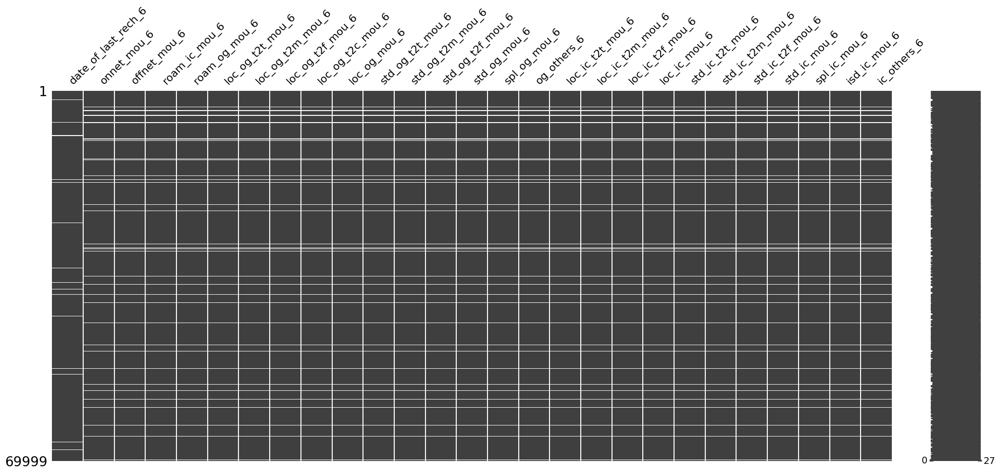

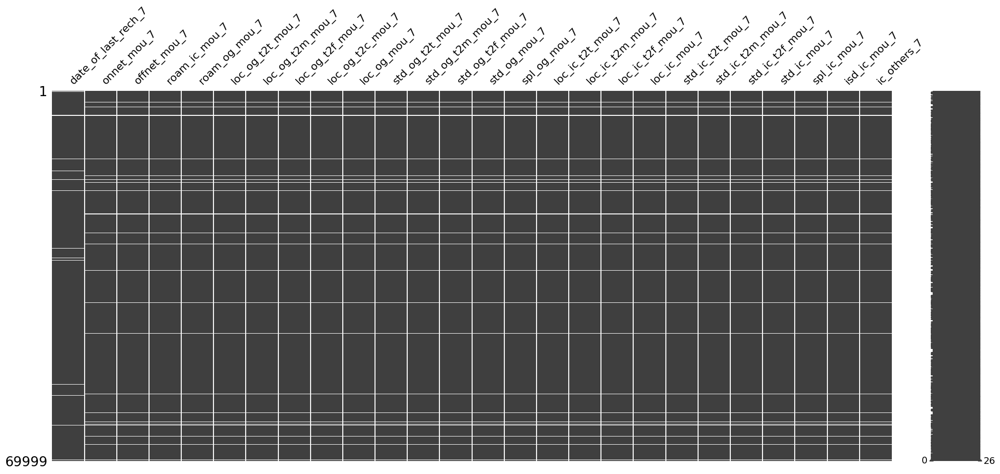

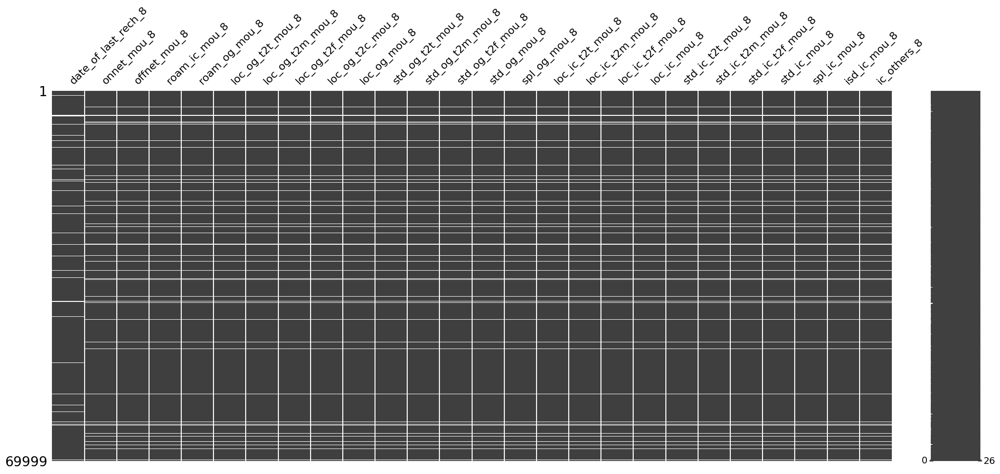

In [22]:
# get a list of missing values' columns
null_cols = []
for i in missing_uniq_vals.index:
    null_cols.extend(missing_uniq_vals.iloc[i,1])

# Visualize the distribution of missing values for variables within the same month.
    
### For installing missingno library, type this command in terminal
### pip install missingno
import missingno as msno

# June of 2014
msno.matrix(data[[i for i in null_cols if re.search(r'6$',i)]])

# July of 2014
msno.matrix(data[[i for i in null_cols if re.search(r'7$',i)]])

# August of 2014
msno.matrix(data[[i for i in null_cols if re.search(r'8$',i)]])



- There are no connections between `date_last_rech` and the other variables in the month.
- The other variables' missing patterns are similar in each month.
    - All these variables represent minutes of phone call usage.     

#### Investigate date_of_last_rech missing pattern

<Axes: >

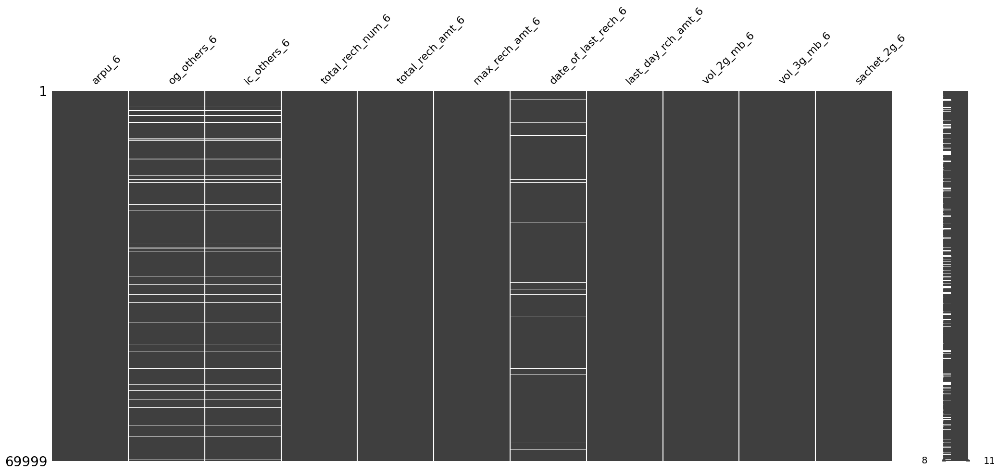

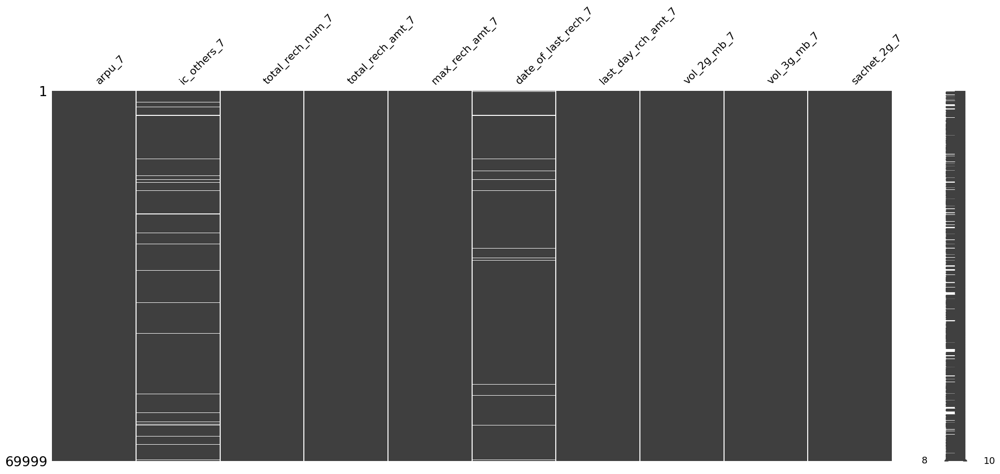

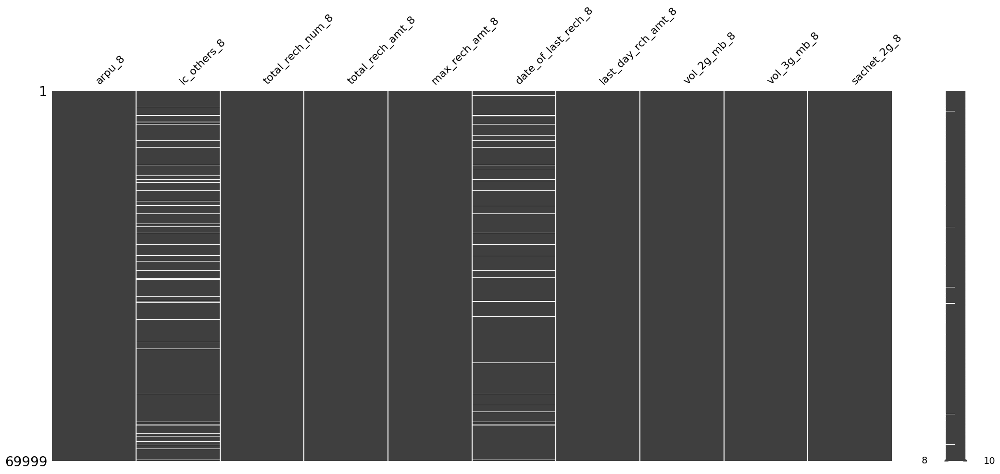

In [23]:
# Identify the variables that are related to the date_of_last_rech variable.
msno.matrix(data[[i for i in data.columns if re.search(r'^(?!.*mou).*6$',i)]])
msno.matrix(data[[i for i in data.columns if re.search(r'^(?!.*mou).*7$',i)]])
msno.matrix(data[[i for i in data.columns if re.search(r'^(?!.*mou).*8$',i)]])

- The `date_of_last_rech` variable is related to 4 variables.
- Examinate those variables.

In [24]:
print('Unique values of other recharge columns where values are null in the date_of_last_rech column:\n')

rech_cols_6 = [i for i in data.columns if re.search(r'^(?!.*mou).*(rech|rch).*6$',i)]
print('June 2014:') 
display({i: data[data[rech_cols_6].isna().any(axis=1)][i].unique().tolist() for i in rech_cols_6})

rech_cols_7 = [i for i in data.columns if re.search(r'^(?!.*mou).*(rech|rch).*7$',i)]
print('July 2014:') 
display({i: data[data[rech_cols_7].isna().any(axis=1)][i].unique().tolist() for i in rech_cols_7})

rech_cols_8 = [i for i in data.columns if re.search(r'^(?!.*mou).*(rech|rch).*8$',i)]
print('August 2014:') 
display({i: data[data[rech_cols_8].isna().any(axis=1)][i].unique().tolist() for i in rech_cols_8})

Unique values of other recharge columns where values are null in the date_of_last_rech column:

June 2014:


{'total_rech_num_6': [0],
 'total_rech_amt_6': [0],
 'max_rech_amt_6': [0],
 'date_of_last_rech_6': [nan],
 'last_day_rch_amt_6': [0]}

July 2014:


{'total_rech_num_7': [0],
 'total_rech_amt_7': [0],
 'max_rech_amt_7': [0],
 'date_of_last_rech_7': [nan],
 'last_day_rch_amt_7': [0]}

August 2014:


{'total_rech_num_8': [0],
 'total_rech_amt_8': [0],
 'max_rech_amt_8': [0],
 'date_of_last_rech_8': [nan],
 'last_day_rch_amt_8': [0]}

- The unique values of those columns are all zeros.
- In other words, there were no recharges happened within those months.
- Consequently, the null values should be imputed using Random Sample Imputation
    -  In this method, samples are randomly selected from rows where any value in the recharge-related columns is equal to 0

In [25]:
import random

# Set the seed
random.seed(1)

# get the list of all recharge related columns
rech_cols = [i for i in data.columns if re.search(r'^(?!.*mou).*(rech|rch).*',i)]

# display all date_of_last_rech columns info 
print('date_of_last_rech before imputation: ')
display(more_info(data[[i for i in rech_cols if re.search(r'date_of_last_rech',i)]]))

# Obtain the dataframe where any value in the recharge related columns is equal to 0
any_equal_0_df = data[(data[rech_cols]==0).any(axis=1)][rech_cols]

# Impute missing values using random samples from the dataframe above
for i in [i for i in rech_cols if re.search(r'date_of_last_rech',i)]:
    data.loc[data[i].isna(), i] = random.choices(any_equal_0_df[i].dropna().to_list(),k=data[i].isna().sum())

print('date_of_last_rech after imputation: ')
display(more_info(data[[i for i in rech_cols if re.search(r'date_of_last_rech',i)]]))

date_of_last_rech before imputation: 


,% zero values,% missing values,data type,uniques
date_of_last_rech_6,NaN,1.572880,object,30
date_of_last_rech_7,NaN,1.762882,object,31
date_of_last_rech_8,NaN,3.515765,object,31


date_of_last_rech after imputation: 


,% zero values,% missing values,data type,uniques
date_of_last_rech_6,NaN,NaN,object,30
date_of_last_rech_7,NaN,NaN,object,31
date_of_last_rech_8,NaN,NaN,object,31


#### Investigate mou variables

<Axes: >

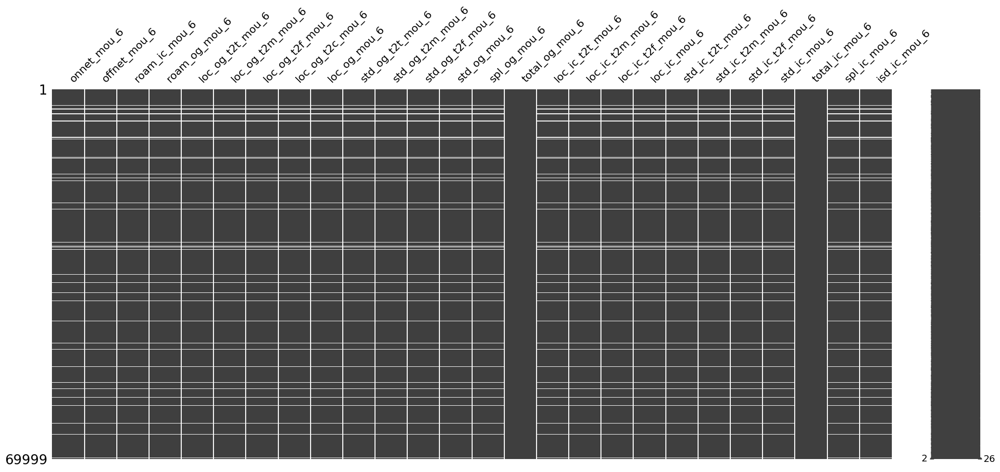

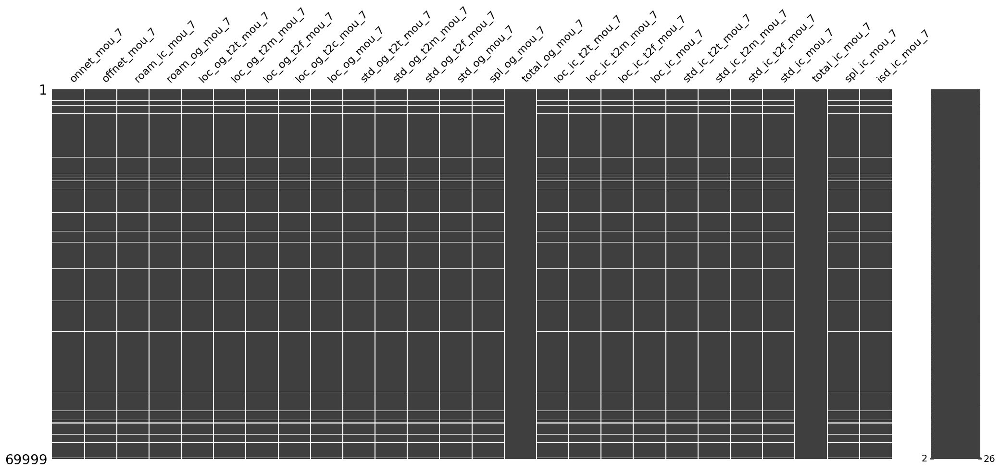

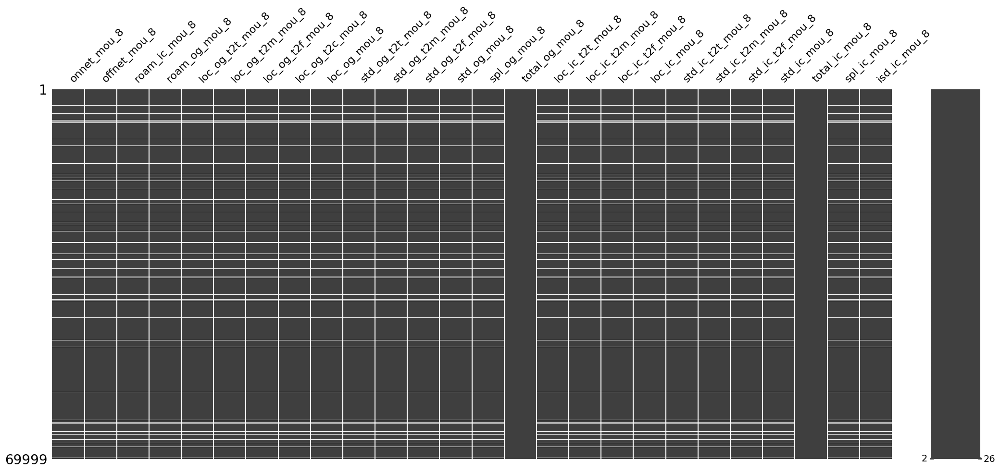

In [26]:
# Visualize the distribution of missing values in the MOU (minutes of phone call usage) variables for each month.
msno.matrix(data[[i for i in (data.columns) if re.search(r'mou_6', i)]])
msno.matrix(data[[i for i in (data.columns) if re.search(r'mou_7', i)]])
msno.matrix(data[[i for i in (data.columns) if re.search(r'mou_8', i)]])

- Only total `mou` columns are free of nulls
- investigate those columns

In [27]:
print('Unique values of the "total" columns where values are null in other "mou" columns')

uniq_mising_total_6 = [i for i in (data.columns) if re.search(r'^total.*.mou_6$|onnet_mou_6', i)]
display({i: data[data[uniq_mising_total_6].isna().any(axis=1)][i].unique().tolist() for i in uniq_mising_total_6})

uniq_mising_total_7 = [i for i in (data.columns) if re.search(r'^total.*.mou_7$|onnet_mou_7', i)]
display({i: data[data[uniq_mising_total_7].isna().any(axis=1)][i].unique().tolist() for i in uniq_mising_total_7})

uniq_mising_total_8 = [i for i in (data.columns) if re.search(r'^total.*.mou_8$|onnet_mou_8', i)]
display({i: data[data[uniq_mising_total_8].isna().any(axis=1)][i].unique().tolist() for i in uniq_mising_total_8})


Unique values of the "total" columns where values are null in other "mou" columns


{'onnet_mou_6': [nan], 'total_og_mou_6': [0.0], 'total_ic_mou_6': [0.0]}

{'onnet_mou_7': [nan], 'total_og_mou_7': [0.0], 'total_ic_mou_7': [0.0]}

{'onnet_mou_8': [nan], 'total_og_mou_8': [0.0], 'total_ic_mou_8': [0.0]}

- The unique values of those columns are all zeros.
- In other words, there were no minutes of usage in those records.
- The null values should be imputed as zero.

Text(0.5, 1.0, 'After imputation')

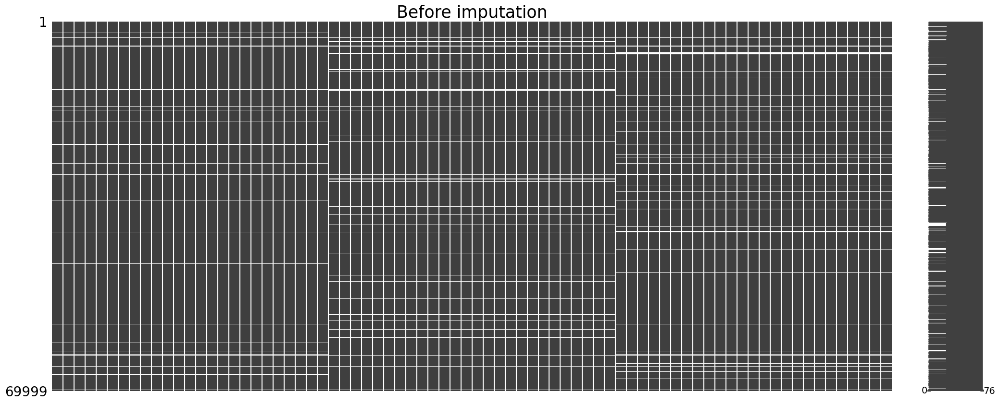

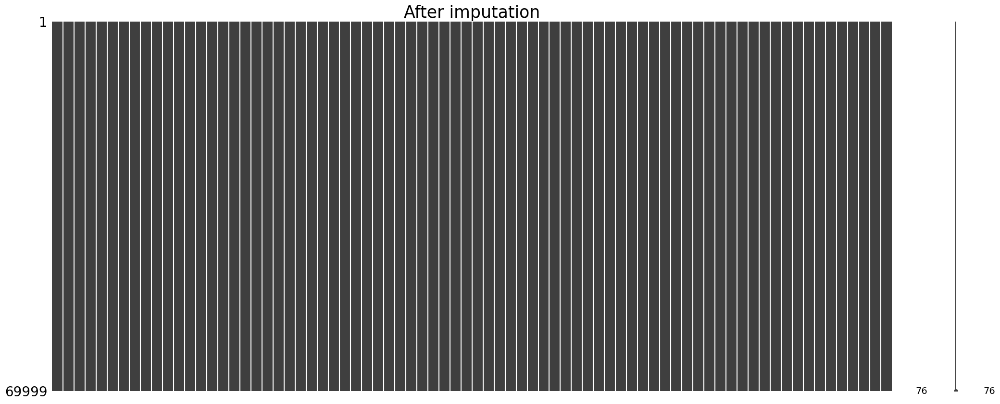

In [28]:
# remaining columns that contain null values
null_cols = [i for i in null_cols if i not in rech_cols]

# check if mull values exists 
msno.matrix(data[null_cols])
plt.title('Before imputation', fontsize=25)


# fillna with 0
[data[i].fillna(0, inplace=True) for i in null_cols]

# check if 0 imputation is completed 
msno.matrix(data[null_cols])
plt.title('After imputation', fontsize=25)

def 

In [29]:
# check if there any null values in the dataset
print('Null values in the dataset: ', data.isna().any().any())

Null values in the dataset:  False


## Feature Engineering

### Analyze object data type

In [30]:
# preview all data types
print('Preview all data types: ')
data_info = more_info(data)
display(data_info.groupby(by='data type').count())

# preview object data type
print('Preview object data info: ')
display(data_info[data_info['data type'] == 'object'])

# preview unique object values
print('Preview unique object data values: ')
object_cols = list(data_info[data_info['data type'] == 'object'].index)
object_data = data [object_cols]
# code gotten from https://stackoverflow.com/questions/47933213/list-unique-values-in-a-pandas-dataframe
object_uniq_vals = pd.DataFrame(pd.Series({i: object_data[i].unique() for i in object_data})).rename(columns={0:'unique values'})
# object_uniq_vals = pd.DataFrame({i: object_data[i].unique() for i in object_data.index}).rename(columns={0:'unique values'})
display(object_uniq_vals.style)

# preview object data table
print('Preview object data table: ')
display(data[data_info[data_info['data type'] == 'object'].index].head())

# store object columns' names

# display(data[data_info[data_info['data type'] == 'object'].index].groupby([data_info['data type'] == 'object']))

# data.groupby(['date_of_last_rech_6', 'date_of_last_rech_7']).nunique()



Preview all data types: 


,% zero values,% missing values,uniques
data type,,,
int64,16,0,17
float64,94,0,94
object,0,0,3


Preview object data info: 


,% zero values,% missing values,data type,uniques
date_of_last_rech_6,NaN,NaN,object,30
date_of_last_rech_7,NaN,NaN,object,31
date_of_last_rech_8,NaN,NaN,object,31


Preview unique object data values: 


,unique values
date_of_last_rech_6,['6/22/2014' '6/12/2014' '6/11/2014' '6/15/2014' '6/25/2014' '6/30/2014' '6/29/2014' '6/20/2014' '6/28/2014' '6/27/2014' '6/26/2014' '6/19/2014' '6/23/2014' '6/24/2014' '6/14/2014' '6/5/2014' '6/8/2014' '6/6/2014' '6/16/2014' '6/13/2014' '6/18/2014' '6/21/2014' '6/17/2014' '6/10/2014' '6/7/2014' '6/2/2014' '6/1/2014' '6/3/2014' '6/9/2014' '6/4/2014']
date_of_last_rech_7,['7/10/2014' '7/22/2014' '7/21/2014' '7/26/2014' '7/27/2014' '7/19/2014' '7/30/2014' '7/16/2014' '7/31/2014' '7/20/2014' '7/25/2014' '7/29/2014' '7/28/2014' '7/7/2014' '7/18/2014' '7/13/2014' '7/17/2014' '7/12/2014' '7/24/2014' '7/15/2014' '7/1/2014' '7/23/2014' '7/9/2014' '7/8/2014' '7/14/2014' '7/11/2014' '7/5/2014' '7/4/2014' '7/6/2014' '7/2/2014' '7/3/2014']
date_of_last_rech_8,['8/24/2014' '8/26/2014' '8/25/2014' '8/30/2014' '8/28/2014' '8/19/2014' '8/5/2014' '8/27/2014' '8/16/2014' '8/21/2014' '8/22/2014' '8/23/2014' '8/15/2014' '8/31/2014' '8/12/2014' '8/10/2014' '8/29/2014' '8/20/2014' '8/13/2014' '8/18/2014' '8/11/2014' '8/14/2014' '8/6/2014' '8/9/2014' '8/8/2014' '8/17/2014' '8/7/2014' '8/1/2014' '8/4/2014' '8/2/2014' '8/3/2014']


Preview object data table: 


,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8
0,6/22/2014,7/10/2014,8/24/2014
1,6/12/2014,7/10/2014,8/26/2014
2,6/11/2014,7/22/2014,8/24/2014
3,6/15/2014,7/21/2014,8/25/2014
4,6/25/2014,7/26/2014,8/30/2014


<i> All object data are date data from June, July, and August of 2014

### Feature Generation

In [31]:
# the original unique object data values 
print('the original unique object data values: ')
[print(col, data[col].unique()) for col in object_cols]

# change object columns to datetime 
data[object_cols] = data[object_cols].apply(pd.to_datetime)

# # Set the baseline date as May 31, 2014.
# import calendar
# from datetime import datetime
# _, baseline_day = calendar.monthrange(2014, 5)
# baseline_date = datetime(2014, 5, baseline_day)

# initialize date lists
date_cols = []

# define `day_of_last_rech` variables to replace date_of_last_rech variable
for i in object_cols:
    # date_cols.extend([i, i.replace('date', 'day')])#, i.replace('date_of', 'days_from_baseline')])
    date_cols.append(i.replace('date', 'day'))#, i.replace('date_of', 'days_from_baseline')])
    data[i.replace('date', 'day')] = data[i].dt.day
    data.drop(columns=i, inplace=True)
    # data[i.replace('date_of', 'days_from_baseline')] = data[i].apply(lambda x: (x - baseline_date).days)
# display(more_info(data[rech_cols]))
# date_cols.extend(['month_of_last_rech', 'days_from_baseline_May_31_2014'])
# convert datetime to integer values
# for col in object_cols:
#     data[col] = data[col].apply(lambda x: x.toordinal())

# show the modifications implemented
# print('the converted unique object values: ')
# [print(col, data[col].unique()) for col in object_cols]
    
# Preview day_of_last_rech data tabl
print('Preview day_of_last_rech data table: ')
display(data[date_cols].head())

the original unique object data values: 
date_of_last_rech_6 ['6/22/2014' '6/12/2014' '6/11/2014' '6/15/2014' '6/25/2014' '6/30/2014'
 '6/29/2014' '6/20/2014' '6/28/2014' '6/27/2014' '6/26/2014' '6/19/2014'
 '6/23/2014' '6/24/2014' '6/14/2014' '6/5/2014' '6/8/2014' '6/6/2014'
 '6/16/2014' '6/13/2014' '6/18/2014' '6/21/2014' '6/17/2014' '6/10/2014'
 '6/7/2014' '6/2/2014' '6/1/2014' '6/3/2014' '6/9/2014' '6/4/2014']
date_of_last_rech_7 ['7/10/2014' '7/22/2014' '7/21/2014' '7/26/2014' '7/27/2014' '7/19/2014'
 '7/30/2014' '7/16/2014' '7/31/2014' '7/20/2014' '7/25/2014' '7/29/2014'
 '7/28/2014' '7/7/2014' '7/18/2014' '7/13/2014' '7/17/2014' '7/12/2014'
 '7/24/2014' '7/15/2014' '7/1/2014' '7/23/2014' '7/9/2014' '7/8/2014'
 '7/14/2014' '7/11/2014' '7/5/2014' '7/4/2014' '7/6/2014' '7/2/2014'
 '7/3/2014']
date_of_last_rech_8 ['8/24/2014' '8/26/2014' '8/25/2014' '8/30/2014' '8/28/2014' '8/19/2014'
 '8/5/2014' '8/27/2014' '8/16/2014' '8/21/2014' '8/22/2014' '8/23/2014'
 '8/15/2014' '8/31/2014' '8

,day_of_last_rech_6,day_of_last_rech_7,day_of_last_rech_8
0,22,10,24
1,12,10,26
2,11,22,24
3,15,21,25
4,25,26,30


In [32]:

# for i in [data[i].name for i in data.columns if re.search(r'of_last_rech',i)]:
#     display({i:data[i].unique()}, data[i].unique().size)

In [33]:

# data[object_cols] = data[object_cols].apply(pd.to_numeric) # code gotten from https://stackoverflow.com/questions/41256626/pandas-typeerror-float-argument-must-be-a-string-or-a-number

# review object data after changing data type
# print('object data after data type transform:')
# display(more_info(data).loc[object_cols,:])
# display(data[object_cols].head())

# Data Spliting

#### split data into train & test set

In [34]:
# Identify the response and predictor variables separately
X = data.drop(columns = ['churn_probability'])
y = data['churn_probability']

X.shape, y.shape

((69999, 113), (69999,))

In [35]:
# split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((55999, 113), (14000, 113), (55999,), (14000,))

#### Drop rows with the highest number of null values

In [36]:
# # generate a summary table with the percentage of nulls in a row.
# null_rows = pd.DataFrame(X_train.isna().mean(axis=1).sort_values(ascending=False)).rename(columns={0:'% of nulls in a row'})
# null_rows = pd.DataFrame(null_rows.iloc[:,0].value_counts())
# null_rows['count %'] = null_rows['count']/ len(X_train) *100
# null_rows.sort_index(inplace=True)

# # import reduce function
# from functools import reduce

# # Create accumulating column
# count_accum = [reduce(lambda x, y: x+y, null_rows.iloc[0:i,1].to_list()) for i in range(1, len(null_rows)+1)]
# null_rows['count % accumulate'] = count_accum
# # display the table
# display(null_rows)



- The table shows the quantity of each percentage of nulls in the data row.
- Drop rows that have more than 60% of null values.

In [37]:
# # Drop rows that have more than 60% of null values
# print('Before droping rows: ', X_train.shape)
# X_train = X_train[X_train.isna().mean(axis=1)<0.6]
# print('After dropping rows: ', X_train.shape)

# EDA

## Univariate Analysis

### Predictor variables

In [38]:
# define custom univariate heatmap function
from matplotlib.colors import ListedColormap

def univariate_heatmap(dt, pct, drop_cols):

    # create dataframe to be used for heatmap
    heatmap_df = dt.describe(include='all', percentiles=pct).transpose().drop(columns=drop_cols)
    heatmap_df_normalized = pd.DataFrame(columns=heatmap_df.columns)
    heatmap_df_normalized = heatmap_df.div(heatmap_df.max(axis=1), axis=0)*100

    fig, ax = plt.subplots(figsize=(15, 22))

    # base heatmap with annotation set to True
        # code gotten from https://stackoverflow.com/questions/33779748/set-max-value-for-color-bar-on-seaborn-heatmap
    sns.heatmap(heatmap_df, annot=True, fmt="g", annot_kws={"color":'white'}, cmap=ListedColormap(['white']), cbar=False, ax=ax) 

    # overlaying heatmap with annotation set to false
    sns.heatmap(heatmap_df_normalized, annot=False, cmap='crest', ax=ax,  cbar_kws={'format': '%.0f%%'})

    # set tick labels on top
    ax.tick_params(top=True, labeltop=True, labelrotation=0)
    plt.tight_layout()



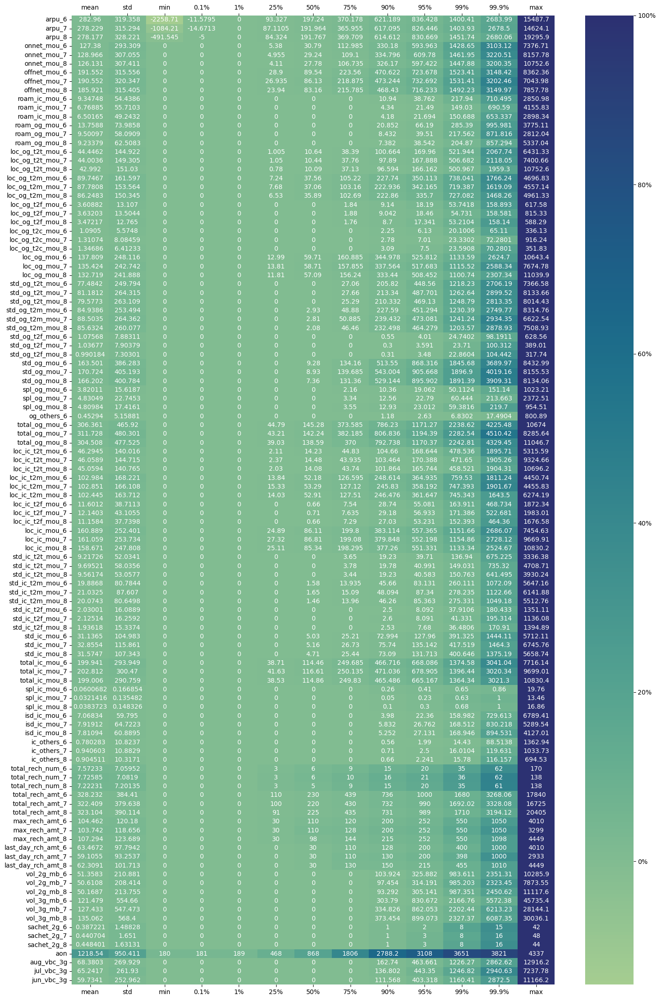

In [39]:
# display the univariate heatmap
univariate_heatmap(X_train.loc[:,~X_train.columns.isin(date_cols)], [.001, .01, .25, .75, .9, .95, .99, .999], ['count'])

### Handling Outliers

Capping Outliers above the 99th percentile and below the 1st percentile. (except for `aon`)

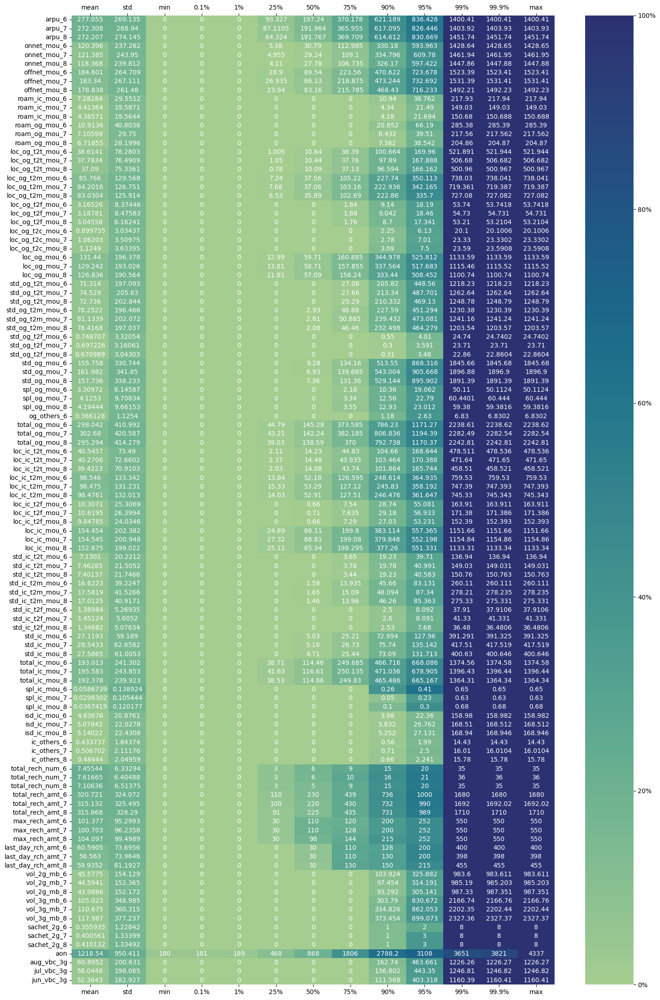

In [40]:
# cap the outliers
capped_down_outliers, capped_up_outliers ={}, {}
for i in X_train.columns[~X_train.columns.isin(date_cols + ['aon'])]: 
    capped_down_outliers[i] = X_train[i].quantile(0.01)
    capped_up_outliers[i] = X_train[i].quantile(0.99)
    X_train[i] = X_train[i].clip(X_train[i].quantile(0.01), X_train[i].quantile(0.99))
# display the univariate heatmap after capping
univariate_heatmap(X_train.loc[:,~X_train.columns.isin(date_cols)], [.001, .01, .25, .75, .9, .95, .99, .999], ['count'])

In [41]:


# heatmap_df = X_train.loc[:,~X_train.columns.isin(date_cols)].describe(include='all', percentiles=[.25, .75, .9, .95, .99]).transpose().drop(columns='count')
# heatmap_df_normalized = pd.DataFrame(columns=heatmap_df.columns)
# heatmap_df_normalized = heatmap_df.div(heatmap_df.max(axis=1), axis=0)*100

# from matplotlib.colors import ListedColormap

# fig, ax = plt.subplots(figsize=(10, 22))

# # code gotten from https://stackoverflow.com/questions/33779748/set-max-value-for-color-bar-on-seaborn-heatmap
# sns.heatmap(heatmap_df, annot=True, fmt=".0f", annot_kws={"color":'white'}, cmap=ListedColormap(['white']), cbar=False, ax=ax) 
# sns.heatmap(heatmap_df_normalized, annot=False,  fmt=".0f", cmap='crest', ax=ax)
# ax.tick_params(top=True, labeltop=True, labelrotation=0)


In [42]:
# # Assuming 'df' is your DataFrame and 'cols' is your list of columns
# print(X_train.shape)
# pct_dict = {}
# # for col in ['arpu_6', 'arpu_7', 'arpu_8']:
# pct_dict = {col: (X_train[col].quantile(0.001)) for col in ['arpu_6', 'arpu_7', 'arpu_8']} # Calculate the 0.1% percentile
# # for col in ['arpu_6', 'arpu_7', 'arpu_8']:
# [X_train.drop(X_train[X_train[col] < pct_dict[col]].index, inplace=True) for col in ['arpu_6', 'arpu_7', 'arpu_8']]
# print(pct_dict)
# print(X_train.shape)

# # print(X_train.shape)

In [43]:
# # Assuming 'df' is your DataFrame and 'cols' is your list of columns

# # Assuming 'df' is your DataFrame and 'cols' is your list of columns
# print(X_train.shape)
# pct_dict = {}
# # for col in ['arpu_6', 'arpu_7', 'arpu_8']:
# pct_dict = {col: (X_train[col].quantile(0.999)) for col in X_train.loc[:,~X_train.columns.isin(date_cols+['aon'])].columns} # Calculate the 0.1% percentile
# # for col in ['arpu_6', 'arpu_7', 'arpu_8']:
# [X_train.drop(X_train[X_train[col] > pct_dict[col]].index, inplace=True) for col in X_train.loc[:,~X_train.columns.isin(date_cols+['aon'])].columns]
# print(pct_dict)
# print(X_train.shape)

# # # print(X_train.shape)
# # print(X_train.shape)
# # for col in X_train_num.loc[:,~X_train_num.columns.isin(['aon'])].columns:
# #     p = X_train[col].quantile(0.999)  # Calculate the 0.1% percentile
# #     X_train.drop(X_train[X_train[col] > p].index, inplace=True) 

# # print(X_train.shape)

In [44]:
# univariate_heatmap(X_train.loc[:,~X_train.columns.isin(date_cols)], [0.1, .25, .75, .9, .95, .99], ['count'])

In [45]:
# univariate_heatmap(X_train.loc[:,~X_train.columns.isin(date_cols+['aon'])], [.991, .992, .993, .994, .995, .996, .997, .998, .999], ['count', 'min', 'mean', 'std'])

In [46]:
# univariate_heatmap(X_train[['arpu_6', 'arpu_7', 'arpu_8']], [0.001,0.002,0.003,0.004,0.005,0.006,0.007,0.008,0.009], ['count', 'max', 'mean', 'std'])

In [47]:
# heatmap_df = X_train.loc[:,['arpu_6', 'arpu_7', 'arpu_8']].describe(include='all', percentiles=[0.001,0.002,0.003,0.004,0.005,0.006,0.007,0.008,0.009]).transpose().drop(columns=['count','50%'])
# heatmap_df_normalized = pd.DataFrame(columns=heatmap_df.columns)
# heatmap_df_normalized = heatmap_df.div(heatmap_df.max(axis=1), axis=0)*100

# from matplotlib.colors import ListedColormap
# fig, ax = plt.subplots(figsize=(10, 22))
# sns.heatmap(heatmap_df,
#             annot=True, fmt=".0f", annot_kws={"color":'white'}, cmap=ListedColormap(['white']), cbar=False, ax=ax) # code gotten from https://stackoverflow.com/questions/33779748/set-max-value-for-color-bar-on-seaborn-heatmap
# sns.heatmap(heatmap_df_normalized,
#             annot=False,  fmt=".0f", cmap='crest', ax=ax)
# ax.tick_params(top=True, labeltop=True, labelrotation=0)


In [48]:
# from sklearn.preprocessing import minmax_scale

# heatmap_df = X_train.loc[:,~X_train.columns.isin(date_cols)].describe(include='all', percentiles=[0.9991,0.9992,0.9993,0.9994,0.9995,0.9996,0.9997,0.9998,0.9999]).transpose().drop(columns='count')
# heatmap_df_normalized = pd.DataFrame(columns=heatmap_df.columns)
# heatmap_df_normalized = heatmap_df.div(heatmap_df.max(axis=1), axis=0)*100
# display(heatmap_df_normalized)

# from matplotlib.colors import ListedColormap
# fig, ax = plt.subplots(figsize=(10, 22))
# sns.heatmap(heatmap_df,
#             annot=True, fmt=".0f", annot_kws={"color":'white'}, cmap=ListedColormap(['white']), cbar=False, ax=ax) # code gotten from https://stackoverflow.com/questions/33779748/set-max-value-for-color-bar-on-seaborn-heatmap
# sns.heatmap(heatmap_df_normalized,
#             annot=False,  fmt=".0f", cmap='crest', ax=ax)
# ax.tick_params(top=True, labeltop=True, labelrotation=0)


### Response variable

<Axes: xlabel='churn_probability', ylabel='Count'>

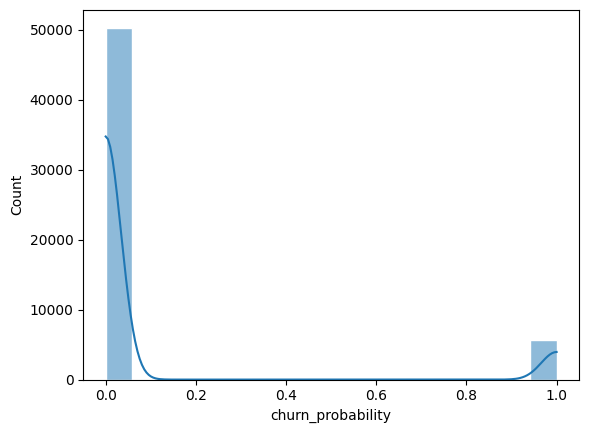

In [49]:
#Distribution for the churn probability
sns.histplot(y_train, edgecolor='white', kde=True)

<i> There is a significant hint of class imbalance in the distribution of target variable.

# Feature Importance

In [50]:
# fit data on random forest model
rf = RandomForestClassifier(n_estimators=100, n_jobs=-1)
rf.fit(X_train, y_train)

# get features importances from X_train
feature_importances = pd.DataFrame({'col':X_train.columns, 'importance':rf.feature_importances_})

Feature importance list: 


([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112],
 [Text(0, 0, 'total_ic_mou_8'),
  Text(1, 0, 'loc_ic_mou_8'),
  Text(2, 0, 'total_og_mou_8'),
  Text(3, 0, 'loc_ic_t2m_mou_8'),
  Text(4, 0, 'arpu_8'),
  Text(5, 0, 'loc_ic_t2t_mou_8'),
  Text(6, 0, 'loc_og_t2m_mou_8'),
  Text(7, 0, 'loc_og_mou_8'),
  Text(8, 0, 'max_rech_amt_8'),
  Text(9, 0, 'total_rech_amt_8'),
  

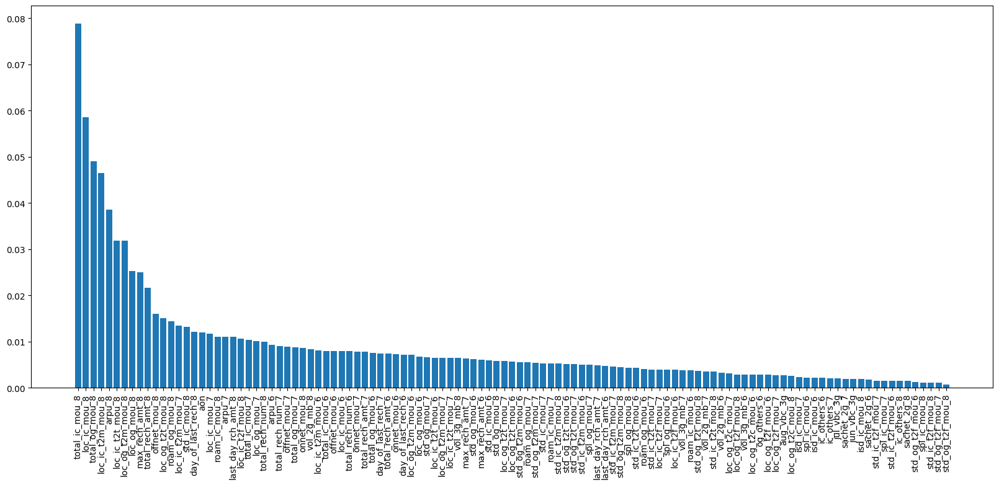

In [51]:
# plot the features importances
feature_importances.sort_values(by='importance', ascending=False, inplace=True)
print('Feature importance list: ')
plt.figure(figsize=(20,8))
# sns.barplot(x=feature_importances['col'], y=feature_importances['importance'])
plt.bar(feature_importances['col'], feature_importances['importance'])
plt.xticks(rotation=90)

In [52]:
print('Top ten predictors of churn: ')
feature_importances[:10]

Top ten predictors of churn: 


,col,importance
75,total_ic_mou_8,0.078770
60,loc_ic_mou_8,0.058503
48,total_og_mou_8,0.048962
54,loc_ic_t2m_mou_8,0.046514
2,arpu_8,0.038476
51,loc_ic_t2t_mou_8,0.031845
20,loc_og_t2m_mou_8,0.031801
29,loc_og_mou_8,0.025275
93,max_rech_amt_8,0.024964
90,total_rech_amt_8,0.021649


### Model building and evaluation

In [53]:
# from imblearn.pipeline import make_pipeline, Pipeline
# from imblearn.over_sampling import ADASYN

# rf = RandomForestClassifier(random_state=42)
# adasyn = ADASYN(random_state=42)
# # grid = {'class__n_estimators': [200, 500],
# #         'class__max_features': ['auto', 'sqrt', 'log2'],
# #         'class__max_depth' : [4,5,6,7,8],
# #         'class__criterion' :['gini', 'entropy']}

# # grid = {'class__n_estimators': [50, 60]}                                      
# grid = {
#     'sampling__n_neighbors': [3, 5, 7],  # Number of nearest neighbors
#     'sampling__sampling_strategy': ['auto', 0.5, 0.7]  # Ratio of minority to majority class
# }
# pipeline = Pipeline([('sampling', adasyn), ('class', rf)])
# grid_cv = GridSearchCV(pipeline, grid, scoring = 'roc_auc', cv = 5)
   
# grid_cv.fit(X_train, y_train)
# grid_cv.best_score_

In [54]:
# # pip install imblearn
# from imblearn.over_sampling import ADASYN
# from sklearn.pipeline import Pipeline
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.model_selection import GridSearchCV

# rf = RandomForestClassifier(random_state=42)
# adasyn = ADASYN(random_state=42)

# param_grid = {
#     'adasyn__n_neighbors': [3, 5, 7],  # Number of nearest neighbors
#     'adasyn__sampling_strategy': ['auto', 0.5, 0.7]  # Ratio of minority to majority class
# }

# pipe = Pipeline([
#     ('adasyn', adasyn),
#     ('clf', rf)
# ])

# grid = GridSearchCV(pipe, param_grid, cv=5, scoring='roc_auc')
# grid.fit(X_train, y_train)
# print(grid.best_params_)

In [55]:
# rf = RandomForestClassifier(random_state=88)
# adasyn = ADASYN(random_state=88)
# grid = {'class__n_estimators': [200, 500],
#         'class__max_features': ['auto', 'sqrt', 'log2'],
#         'class__max_depth' : [4,5,6,7,8],
#         'class__criterion' :['gini', 'entropy']}
# pipeline = Pipeline([('sampling', adasyn), ('class', rf)])
# grid_cv = GridSearchCV(pipeline, grid, scoring = 'roc_auc', cv = 5)
   
# grid_cv.fit(X_train, y_train)
# grid_cv.best_score_

In [56]:
# adasyn = ADASYN(sampling_strategy='auto', random_state=42)
# X_resampled, y_resampled = adasyn.fit_resample(X_train, y_train)
# # sns.histplot(y_train)
# # sns.histplot(y_resampled)
# sns.scatterplot(x=X_train['total_ic_mou_8'], y=X_train['total_og_mou_8'], hue=y_train, alpha=0.5)
# plt.show()
# sns.scatterplot(x=X_resampled['total_ic_mou_8'], y=X_resampled['total_og_mou_8'], hue=y_resampled, alpha=0.5)
# plt.show()



## Class imbalance

<Axes: xlabel='churn_probability', ylabel='Count'>

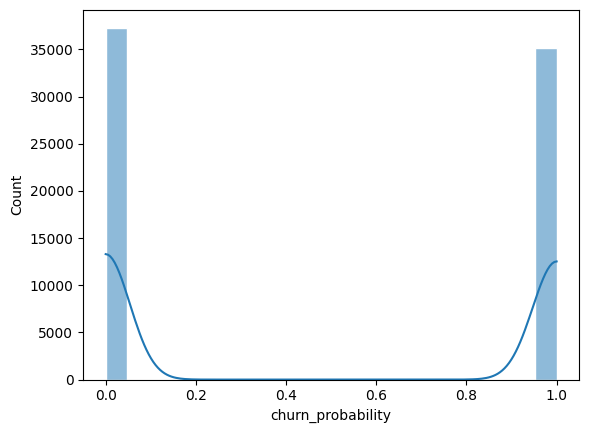

In [57]:
from imblearn.over_sampling import ADASYN
from imblearn.under_sampling import EditedNearestNeighbours
from imblearn.pipeline import make_pipeline

# Create an ADASYN instance
adasyn = ADASYN(sampling_strategy=0.7, random_state=42)

# Create an ENN instance
enn = EditedNearestNeighbours()


# Make a pipeline of ADASYN and ENN
pipeline = make_pipeline(adasyn, enn)

# Fit and resample with X_train and y_train
X_resampled, y_resampled = pipeline.fit_resample(X_train, y_train)

#Distribution for the churn probability
sns.histplot(y_resampled, edgecolor='white', kde=True)

## Build and evaluate model

In [58]:
pca = PCA(n_components=50)
rf = RandomForestClassifier(n_estimators=100, min_samples_leaf=15, max_depth=30, n_jobs=-1, oob_score=True, random_state=42)

# create model pipline 
pipe = Pipeline(steps = [('pca',pca),
                         ('model',rf)])

In [59]:
# define model building function 
from imblearn.metrics import specificity_score
def model_build_eval(X, y, data_name):

    print(f'\nPerform model building and evaluating on {data_name} set:')
    pipe.fit(X, y)

    #data_name set
    print(f"\n- {data_name} set:")

    # accuracy score on train data
    print("     + Accuracy:", pipe.score(X, y))

    ## because 
    # make predictions for train data
    y_pred = pipe.predict(X)

    # Calculate the recall score
    recall = recall_score(y, y_pred)
    print("     + Recall/Sensitivity:", recall)

    # Calculate the precision score
    precision = precision_score(y, y_pred)
    print("     + Precision:", precision)

    # calcuate the specificity score
    specificity = specificity_score(y, y_pred, pos_label=0)
    print("     + specificity:", specificity)    

    # test set
    print("\n- test set:")
    
    # accuracy score on test data
    print("     + Accuracy:", pipe.score(X_test, y_test))

    # make predictions for train data
    y_pred = pipe.predict(X_test)

    # Calculate the recall score
    recall = recall_score(y_test, y_pred)
    print("     + Recall/Sensitivity:", recall)

    # Calculate the precision score
    precision = precision_score(y_test, y_pred)
    print("     + Precision:", precision)

    # calcuate the specificity score
    specificity = specificity_score(y_test, y_pred, pos_label=0)
    print("     + specificity:", specificity)    


In [60]:
# run model building and evaluating
model_build_eval(X_resampled, y_resampled, 'resampled')


Perform model building and evaluating on resampled set:



- resampled set:
     + Accuracy: 0.9650735801651067
     + Recall/Sensitivity: 0.9558237504269612
     + Precision: 0.971699751143006
     + specificity: 0.9558237504269612

- test set:
     + Accuracy: 0.8451428571428572
     + Recall/Sensitivity: 0.8220815752461322
     + Precision: 0.37905317769131
     + specificity: 0.8220815752461322


In [61]:
# # initialize model
# pca = PCA(n_components=10)
# rf = RandomForestClassifier(n_estimators=100, min_samples_leaf=20, n_jobs=-1, oob_score=True, random_state=42)

# # create model pipline 
# pipe = Pipeline(steps = [('pca',pca),
#                          ('model',rf)])

# # fit model to data
# pipe.fit(X_resampled, y_resampled)

# # accuracy score on train data
# print("Training accuracy:", pipe.score(X_resampled, y_resampled))

# # make predictions for train data
# y_pred = pipe.predict(X_resampled)

# # Calculate the recall score
# recall = recall_score(y_resampled, y_pred)
# print("Recall:", recall)

# # Calculate the precision score
# precision = precision_score(y_resampled, y_pred)
# print("Precision:", precision)

# # accuracy score on test data
# print("Test accuracy:", pipe.score(X_test, y_test))

# # make predictions for train data
# y_pred = pipe.predict(X_test)

# # Calculate the recall score
# recall = recall_score(y_test, y_pred)
# print("Recall:", recall)

# # Calculate the precision score
# precision = precision_score(y_test, y_pred)
# print("Precision:", precision)

# Hyperparameter tuning

In [62]:
# from imblearn.over_sampling import ADASYN
# from imblearn.under_sampling import EditedNearestNeighbours
# from sklearn.decomposition import PCA
# from sklearn.ensemble import RandomForestClassifier
# from imblearn.pipeline import make_pipeline
# from sklearn.model_selection import GridSearchCV

# # Create instances of the models
# adasyn = ADASYN()
# enn = EditedNearestNeighbours()
# pca = PCA()
# rf = RandomForestClassifier()

# # Create a pipeline
# pipeline = make_pipeline(adasyn, enn, pca, rf)

# # Define the parameter grid
# param_grid = {
#     'adasyn__n_neighbors': [3, 5, 7], # Number of nearest neighbors
#     'adasyn__sampling_strategy': ['auto', 0.5, 0.7],  # Ratio of minority to majority class
#     'editednearestneighbours__n_neighbors': [3, 5, 7],
#     'pca__n_components': [5, 10, 15],
#     'randomforestclassifier__n_estimators': [100, 200, 300],
#     'randomforestclassifier__max_depth': [None, 5, 10]
# }

# scoring = ['accuracy', 'recall', 'precision', 'f1_macro', 'roc_auc']

# # Create a GridSearchCV instance
# grid = GridSearchCV(pipeline, param_grid, cv=5)

# # Select the first 1000 samples
# X_train_sub = X_train[:1000]
# y_train_sub = y_train[:1000]

# # Fit and tune model on the subset
# grid.fit(X_train_sub, y_train_sub)


# # # Fit and tune model
# # grid.fit(X_train, y_train)


In [63]:
# pca = PCA(n_components=10)
# rf = RandomForestClassifier(n_estimators=100, min_samples_leaf=20, n_jobs=-1, oob_score=True, random_state=42)

# pipe = Pipeline(steps = [('pca',pca),
#                          ('model',rf)])

# pipe.fit(X_train, y_train)
# train_score = pipe.score(X_train, y_train)
# print("Training accuracy:", train_score)

# y_pred = pipe.predict(X_train)

# # Calculate the recall score
# recall = recall_score(y_train, y_pred)
# print("Recall:", recall)

# precision = precision_score(y_train, y_pred)
# print("Precision:", precision)

# test_score = pipe.score(X_test, y_test)
# print("Test accuracy:", test_score)

# y_pred = pipe.predict(X_test)

# # Calculate the recall score
# recall = recall_score(y_test, y_pred)
# print("Recall:", recall)

# precision = precision_score(y_test, y_pred)
# print("Precision:", precision)

# submission

## Unseen data transformation

### date data

#### Imputation

In [64]:
# get the list of all date_of_last_rech columns
date_cols = [i for i in unseen.columns if re.search(r'^date_of_last_rech_\d$',i)]

# Obtain the dataframe where any value in the recharge related columns is equal to 0
any_equal_0_df = unseen[(unseen[rech_cols]==0).any(axis=1)][rech_cols]

# display all date_of_last_rech columns info 
print('date_of_last_rech before imputation: ')
display(more_info(unseen[date_cols]))

# Impute missing values using random samples from the dataframe above
for i in date_cols:
    unseen.loc[unseen[i].isna(), i] = random.choices(any_equal_0_df[i].dropna().to_list(),k=unseen[i].isna().sum())

# display all date_of_last_rech columns info 
print('date_of_last_rech after imputation: ')
display(more_info(unseen[date_cols]))

date_of_last_rech before imputation: 


,% zero values,% missing values,data type,uniques
date_of_last_rech_6,NaN,1.686667,object,30
date_of_last_rech_7,NaN,1.776667,object,31
date_of_last_rech_8,NaN,3.870000,object,31


date_of_last_rech after imputation: 


,% zero values,% missing values,data type,uniques
date_of_last_rech_6,NaN,NaN,object,30
date_of_last_rech_7,NaN,NaN,object,31
date_of_last_rech_8,NaN,NaN,object,31


####  Transform date to days

In [65]:
# change object columns to datetime 
unseen[date_cols] = unseen[date_cols].apply(pd.to_datetime)

# initialize temporal date lists
temp_date_cols = []

# define `day_of_last_rech` variables to replace date_of_last_rech variable
for i in date_cols:
    temp_date_cols.append(i.replace('date', 'day'))#, i.replace('date_of', 'days_from_baseline')])
    unseen[i.replace('date', 'day')] = unseen[i].dt.day
    unseen.drop(columns=i, inplace=True)
    
# assign date_cols to new date data
date_cols = temp_date_cols

print('Preview day_of_last_rech data table: ')
display(unseen[date_cols].head())

Preview day_of_last_rech data table: 


,day_of_last_rech_6,day_of_last_rech_7,day_of_last_rech_8
0,21,26,24
1,19,16,24
2,29,27,28
3,25,30,24
4,29,29,30


### Remaining Imputation

In [66]:
print('Null values exist:', unseen.isna().any().any())
unseen.fillna(0, inplace=True)
print('Null values exist:', unseen.isna().any().any())

Null values exist: True
Null values exist: False


### Handling outliers

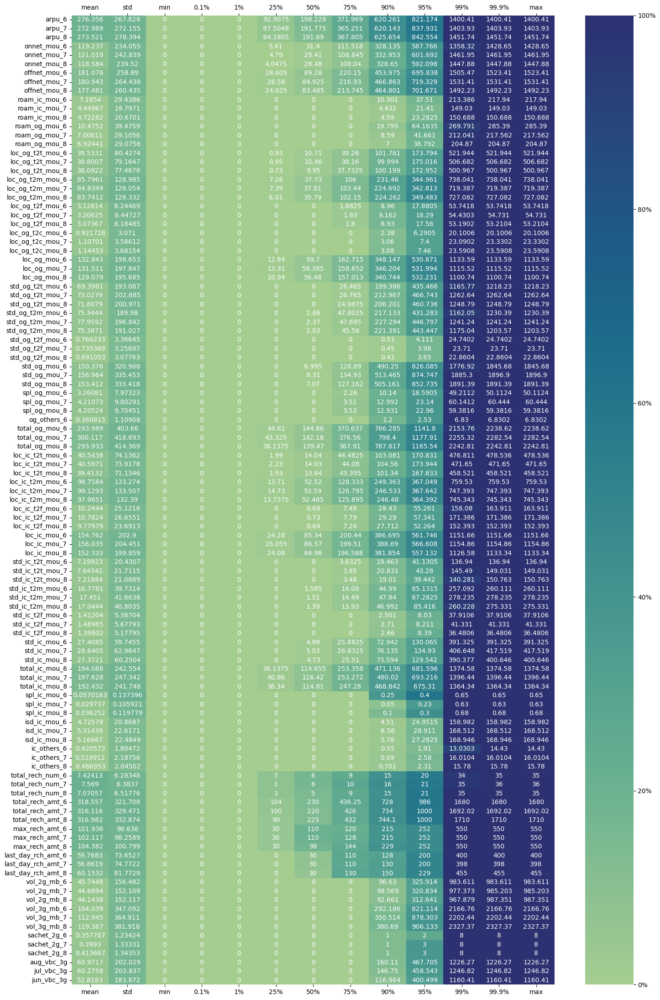

In [67]:
# cap the outliers
for i in unseen.columns[unseen.columns.isin(list(capped_down_outliers.keys()))]: 
    unseen[i] = unseen[i].clip(capped_down_outliers[i], capped_up_outliers[i])

# display the univariate heatmap after capping
univariate_heatmap(unseen.loc[:,unseen.columns.isin(list(capped_down_outliers.keys()))], [.001, .01, .25, .75, .9, .95, .99, .999], ['count'])

## Submit data

In [59]:
# initialize submission data
submission_data = unseen.set_index('id')[X_train.columns]
submission_data.shape

# generate predictions
unseen['churn_probability'] = pipe.predict(submission_data)

# generate output data
output = unseen[['id','churn_probability']]
output.head()

# output to csv file
output.to_csv('Khang_Yasavi.csv',index=False)

# Recommendations

In [ ]:
# # pip install imblearn
# from imblearn.over_sampling import ADASYN
# # from sklearn.pipeline import Pipeline

# pipe = Pipeline([
#     ('adasyn', ADASYN()),
#     ('clf', RandomForestClassifier())
# ])
# param_grid = {
#     'adasyn__n_neighbors': [3, 5, 7],  # Number of nearest neighbors
#     'adasyn__sampling_strategy': ['auto', 0.5, 0.7]  # Ratio of minority to majority class
# }

# grid = GridSearchCV(pipe, param_grid, cv=5, scoring='f1_macro')
# grid.fit(X_train, y_train)
# print(grid.best_params_)

ValueError: 
All the 45 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 423, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 357, in _fit
    self._validate_steps()
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 241, in _validate_steps
    raise TypeError(
TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'ADASYN(n_neighbors=3)' (type <class 'imblearn.over_sampling._adasyn.ADASYN'>) doesn't

--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 423, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 357, in _fit
    self._validate_steps()
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 241, in _validate_steps
    raise TypeError(
TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'ADASYN(n_neighbors=3, sampling_strategy=0.5)' (type <class 'imblearn.over_sampling._adasyn.ADASYN'>) doesn't

--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 423, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 357, in _fit
    self._validate_steps()
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 241, in _validate_steps
    raise TypeError(
TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'ADASYN(n_neighbors=3, sampling_strategy=0.7)' (type <class 'imblearn.over_sampling._adasyn.ADASYN'>) doesn't

--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 423, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 357, in _fit
    self._validate_steps()
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 241, in _validate_steps
    raise TypeError(
TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'ADASYN()' (type <class 'imblearn.over_sampling._adasyn.ADASYN'>) doesn't

--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 423, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 357, in _fit
    self._validate_steps()
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 241, in _validate_steps
    raise TypeError(
TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'ADASYN(sampling_strategy=0.5)' (type <class 'imblearn.over_sampling._adasyn.ADASYN'>) doesn't

--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 423, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 357, in _fit
    self._validate_steps()
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 241, in _validate_steps
    raise TypeError(
TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'ADASYN(sampling_strategy=0.7)' (type <class 'imblearn.over_sampling._adasyn.ADASYN'>) doesn't

--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 423, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 357, in _fit
    self._validate_steps()
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 241, in _validate_steps
    raise TypeError(
TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'ADASYN(n_neighbors=7)' (type <class 'imblearn.over_sampling._adasyn.ADASYN'>) doesn't

--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 423, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 357, in _fit
    self._validate_steps()
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 241, in _validate_steps
    raise TypeError(
TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'ADASYN(n_neighbors=7, sampling_strategy=0.5)' (type <class 'imblearn.over_sampling._adasyn.ADASYN'>) doesn't

--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 423, in fit
    Xt = self._fit(X, y, **fit_params_steps)
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 357, in _fit
    self._validate_steps()
  File "C:\Users\khang\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\pipeline.py", line 241, in _validate_steps
    raise TypeError(
TypeError: All intermediate steps should be transformers and implement fit and transform or be the string 'passthrough' 'ADASYN(n_neighbors=7, sampling_strategy=0.7)' (type <class 'imblearn.over_sampling._adasyn.ADASYN'>) doesn't


### Dependence list

In [42]:
# X_train_corr =  X_train.corr()

# # Apply a mask for absolute values above 0.5
# mask = np.abs(X_train_corr) > 0.5

# # Apply the mask to the correlation matrix
# X_train_corr = X_train_corr[mask]

In [43]:
# import scipy
# import scipy.cluster.hierarchy as sch

# def cluster_corr(corr_array, inplace=False):
#     """
#     Rearranges the correlation matrix, corr_array, so that groups of highly 
#     correlated variables are next to eachother 
    
#     Parameters
#     ----------
#     corr_array : pandas.DataFrame or numpy.ndarray
#         a NxN correlation matrix 
        
#     Returns
#     -------
#     pandas.DataFrame or numpy.ndarray
#         a NxN correlation matrix with the columns and rows rearranged
#     """
#     pairwise_distances = sch.distance.pdist(corr_array)
#     linkage = sch.linkage(pairwise_distances, method='complete')
#     cluster_distance_threshold = pairwise_distances.max()/2
#     idx_to_cluster_array = sch.fcluster(linkage, cluster_distance_threshold, 
#                                         criterion='distance')
#     idx = np.argsort(idx_to_cluster_array)
    
#     if not inplace:
#         corr_array = corr_array.copy()
    
#     if isinstance(corr_array, pd.DataFrame):
#         return corr_array.iloc[idx, :].T.iloc[idx, :]
#     return corr_array[idx, :][:, idx]

In [44]:
# import pandas as pd
# import numpy as np

# # Calculate the correlation matrix
# corr_matrix = X_train.corr().abs()

# # Create a Series from the correlation matrix
# pairs = corr_matrix.unstack()

# # Drop pairs of the same feature
# print('Before drop pairs of the same feature:\n', pairs.sort_index())
# pairs = pairs[pairs.index.get_level_values(0) != pairs.index.get_level_values(1)]
# print('\nAfter drop pairs of the same feature:\n', pairs.sort_index())

# # # sort the index such that the pair (A, B) is considered the same as (B, A
# # print('Before sort index:\n', pairs.sort_index())
# # pairs.index = pd.MultiIndex.from_tuples([tuple(sorted(t)) for t in pairs.index])
# # pairs.sort_index(inplace=True)
# # print('\nAfter sort index:\n', pairs)

# # drop dublicated rows
# sorted_pairs = pairs.reset_index()
# sorted_pairs.columns = ['feature 1', 'feature 2', 'correlation']
# display('Before drop duplicated rows:', sorted_pairs)
# # sorted_pairs.drop_duplicates(inplace=True)
# # display('After drop duplicated rows:', sorted_pairs)


In [45]:
# # number of features that correlated to the feature 1
# corr_num = sorted_pairs[sorted_pairs['correlation']>0.5].groupby('feature 1').count()['correlation']
# corr_num = corr_num.reset_index()

# corr_num.columns = ['feature 1', 'number of correlated features']

In [46]:
# sorted_pairs[sorted_pairs['correlation']>0.5].groupby('feature 1').count().sort_values(by='correlation', ascending=False)


In [47]:
# # get max values' indexes
# max_indexes = sorted_pairs.groupby('feature 1')['correlation'].idxmax().values

# # remove null values from the array
# print('number of values before remove nan:',max_indexes.size)
# max_indexes = max_indexes[~np.isnan(max_indexes)]
# print('number of values after remove nan:',max_indexes.size)

# # convert array to list
# max_indexes.astype(int).tolist()

# # create max correration dataframe for each pair of features
# max_corr = sorted_pairs.iloc[max_indexes.astype(int).tolist(),:]
# max_corr.rename(columns={'correlation':'max correlation'}, inplace=True)
# max_corr.sort_values(by='max correlation', ascending=False, inplace=True)

# max_corr[max_corr['max correlation'] > 0.8]

In [48]:
def corr_pairs_df(dt, percentage):    
    # # create pairs of correlated features dataframe

    # Calculate the correlation matrix
    corr_matrix = dt.corr().abs()

    # Create a Series from the correlation matrix
    pairs = corr_matrix.unstack()

    # Drop pairs of the same feature
    # print('Before drop pairs of the same feature:\n', pairs.sort_index())
    pairs = pairs[pairs.index.get_level_values(0) != pairs.index.get_level_values(1)]
    # print('\nAfter drop pairs of the same feature:\n', pairs.sort_index())

    # create correlated features' pairs dataframe
    sorted_pairs = pairs.reset_index()
    sorted_pairs.columns = ['feature 1', 'max correlated with', 'correlation']

    # # create number of correlated features dataframe

    # number of features that correlated to the feature 1
    corr_num = sorted_pairs[sorted_pairs['correlation']>=percentage].groupby('feature 1').count()['correlation']
    corr_num = corr_num.reset_index()

    # rename columns
    corr_num.columns = ['feature 1', 'number of correlated features']

    # # create max correlation dataframe

    # get max values' indexes
    max_indexes = sorted_pairs.groupby('feature 1')['correlation'].idxmax().values

    # remove null values from the array
    # print('number of values before remove nan:',max_indexes.size)
    max_indexes = max_indexes[~np.isnan(max_indexes)]
    # print('number of values after remove nan:',max_indexes.size)

    # convert array to list
    max_indexes.astype(int).tolist()

    # create max correration dataframe for each pair of features
    max_corr = sorted_pairs.iloc[max_indexes.astype(int).tolist(),:]
    max_corr.rename(columns={'correlation':'max correlation'}, inplace=True)
    max_corr.sort_values(by='max correlation', ascending=False, inplace=True)

    # max_corr[max_corr['max correlation'] > max_threshole]

    ## combine both dataframes
    corr_combined = pd.merge(max_corr, corr_num, on='feature 1')
    print(f'correrlation table with correlation values above {percentage}')
    return corr_combined.sort_values(by=['max correlation', f'number of correlated features above {percentage}'], ascending=False)

In [49]:
corr_pairs_df(X_train, 0.6).style

correrlation table with correlation values above 0.5


,feature 1,correlated with,max correlation,number of correlated features
0,arpu_8,total_rech_amt_8,0.952144,15
1,total_rech_amt_8,arpu_8,0.952144,15
2,arpu_6,total_rech_amt_6,0.951382,15
3,total_rech_amt_6,arpu_6,0.951382,15
4,total_rech_amt_7,arpu_7,0.951140,17
5,arpu_7,total_rech_amt_7,0.951140,17
7,loc_ic_mou_6,total_ic_mou_6,0.914927,13
6,total_ic_mou_6,loc_ic_mou_6,0.914927,11
9,loc_ic_mou_8,total_ic_mou_8,0.908232,14
8,total_ic_mou_8,loc_ic_mou_8,0.908232,11


From the correlated table above, remove the followings:
- all `total_rech_amt` columns because `arpu` is more important
- all `loc_ic_mou` columns because `total_ic_mou` is more important and have less correlated features above 0.5
- all `loc_ic_mou` columns because `loc_og_t2m_mou` is more important and have less correlated features above 0.5

In [50]:
# remove columns
print('Before remove columns:\n', X_train.columns)
X_train = X_train.filter(regex='^(?!.*total_rech_amt|.*loc_ic_mou|.*loc_og_mou).*$')
print('After remove columns:\n', X_train.columns)

Before remove columns:
 Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6',
       ...
       'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'aon', 'aug_vbc_3g',
       'jul_vbc_3g', 'jun_vbc_3g', 'day_of_last_rech_6', 'day_of_last_rech_7',
       'day_of_last_rech_8'],
      dtype='object', length=113)
After remove columns:
 Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'roam_ic_mou_6',
       ...
       'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'aon', 'aug_vbc_3g',
       'jul_vbc_3g', 'jun_vbc_3g', 'day_of_last_rech_6', 'day_of_last_rech_7',
       'day_of_last_rech_8'],
      dtype='object', length=104)


In [51]:
# print('Before remove columns:\n', X_train.columns)
# X_train = X_train.filter(regex='^(?!.*loc_og_mou).*$')
# print('After remove columns:\n', X_train.columns)

In [52]:
corr_pairs_df(X_train, 0.5).style

correrlation table with correlation values above 0.5


,feature 1,correlated with,max correlation,number of correlated features
0,onnet_mou_8,std_og_t2t_mou_8,0.883565,10
1,std_og_t2t_mou_8,onnet_mou_8,0.883565,9
3,onnet_mou_7,std_og_t2t_mou_7,0.879892,12
2,std_og_t2t_mou_7,onnet_mou_7,0.879892,10
4,std_ic_mou_6,std_ic_t2m_mou_6,0.873777,6
5,std_ic_t2m_mou_6,std_ic_mou_6,0.873777,5
6,std_ic_mou_7,std_ic_t2m_mou_7,0.873241,7
7,std_ic_t2m_mou_7,std_ic_mou_7,0.873241,5
9,std_ic_mou_8,std_ic_t2m_mou_8,0.871005,7
8,std_ic_t2m_mou_8,std_ic_mou_8,0.871005,5


In [53]:
# corr_combined = pd.merge(max_corr, corr_num, on='feature 1')
# display(corr_combined.sort_values(by=['max correlation', 'number of correlated features'], ascending=False).style)


### heatmap

<Axes: >

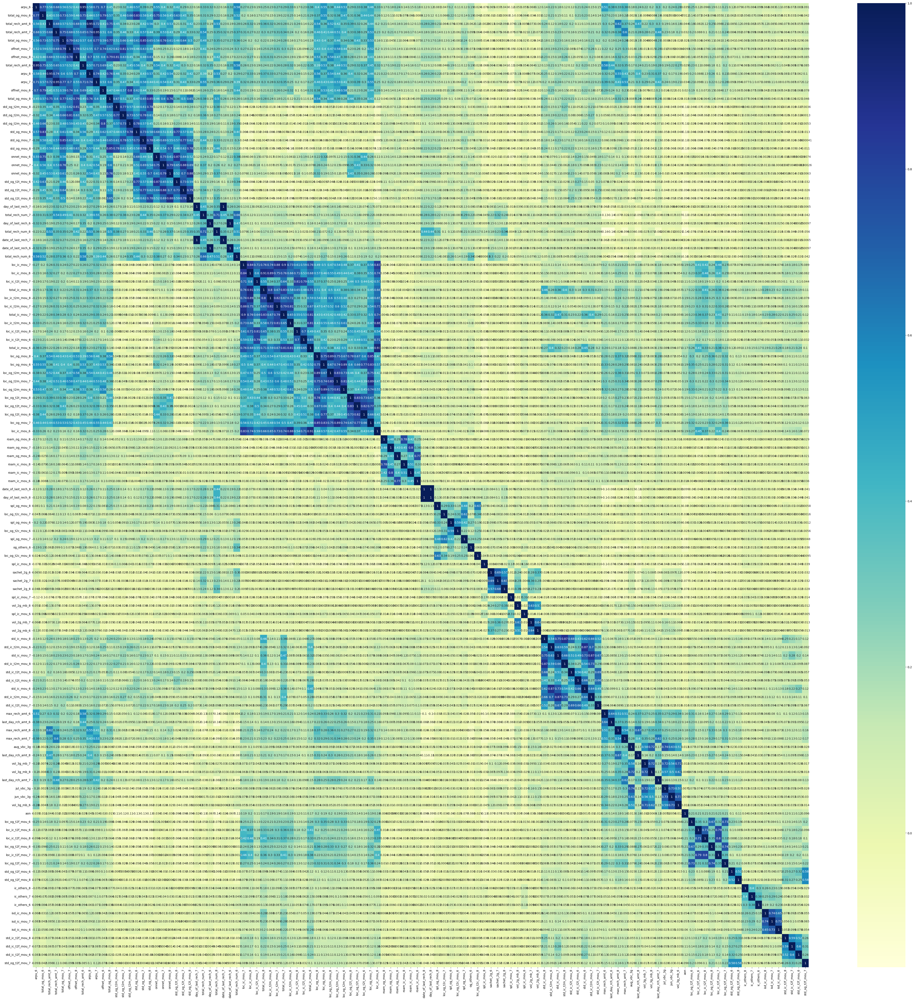

In [ ]:
plt.figure(figsize=(60,60))
sns.heatmap(cluster_corr(X_train.corr()), cmap='YlGnBu', annot=True)

#### Feature transformations

In [ ]:
# from sklearn.preprocessing import PowerTransformer

# pt = PowerTransformer(method='yeo-johnson', standardize=False)

# X_train.loc[:,~X_train.columns.isin(date_cols + ['aon'])] = pt.fit_transform(X_train.loc[:,~X_train.columns.isin(date_cols + ['aon'])])


In [ ]:
# univariate_heatmap(X_train.loc[:,~X_train.columns.isin(date_cols)], [.25, .75], ['count'])

In [ ]:
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.base import clone
# import numpy as np
# import pandas as pd

# # Assume rf is your RandomForestClassifier and X, y are your data
# rf = RandomForestClassifier(oob_score=True)
# rf.fit(X, y)

# # Get the OOB score of the original model
# baseline = rf.oob_score_

# # Store the feature importances
# importances = []

# for col in X.columns:
#     # Drop the column from the dataset
#     X_dropped = X.drop(columns=[col])
    
#     # Train a new classifier on the modified dataset
#     rf_ = clone(rf)
#     rf_.fit(X_dropped, y)
    
#     # Get the OOB score of the new model
#     o = rf_.oob_score_
    
#     # The importance of the 'col' feature is the decrease in the score
#     importances.append(baseline - o)

# # Convert the importances into a DataFrame for easier handling
# importances = pd.DataFrame(importances, index=X.columns, columns=["Importance"])


In [55]:
from sklearn.metrics import accuracy_score

# Assume X, y are your data

# Store the feature importances
imp = {}

def s_col_imp(rf):

    for col in X_train.columns:
        # Create a new dataset with only this feature
        X_train_single = X_train[[col]]
        X_test_single = X_test[[col]]
        
        # Train a classifier on this single feature
        rf.fit(X_train_single, y_train)
        
        # Get the accuracy score of the model
        score = accuracy_score(y_test, rf.predict(X_test_single))
        
        # The importance of the 'col' feature is its accuracy score
        imp[col] = score
    imp_df = pd.DataFrame.from_dict(imp, orient='index').reset_index()
    imp_df.columns = ['feature', 'importance']
    return imp_df


In [82]:
from sklearn.base import clone
from sklearn.tree import DecisionTreeClassifier
def dropcol_importances(mdl):
    mdl_ = clone(mdl)
    mdl_.fit(X_train, y_train)
    original_score = accuracy_score(y_test, mdl_.predict(X_test))
    # baseline = mdl_.oob_score_
    # imp = []
    imp = {}

    for col in X_train.columns:
        # Drop the column from the dataset
        X_train_dropped = X_train.drop(columns=[col])
        X_test_dropped = X_test.drop(columns=[col])
        # Train a new classifier on the modified dataset
        mdl_ = clone(mdl)
        mdl_.fit(X_train_dropped, y_train)
        # Get the OOB score of the new model
        # o = mdl_.oob_score_
        dropped_score = accuracy_score(y_test, mdl_.predict(X_test_dropped))
        # The importance of the 'col' feature is the decrease in the score
        # imp.append(baseline - o)  
        imp[col] = (original_score - dropped_score)


    # Convert the imp into a DataFrame for easier handling 
    I = pd.DataFrame(imp, index=X_train.columns, columns=["Importance"])
    I = I.sort_values('Importance', ascending=True)
    return I


In [83]:

forest = RandomForestClassifier(n_estimators=100, min_samples_leaf=20, n_jobs=-1, oob_score=True, random_state=42)
tree = DecisionTreeClassifier(random_state=42)
# f_imp_scores = s_col_imp(forest)
f_imp_scores = dropcol_importances(tree)
display(f_imp_scores)


In [77]:
f_imp_scores.sort_values(by='importance', ascending=False, inplace=True)

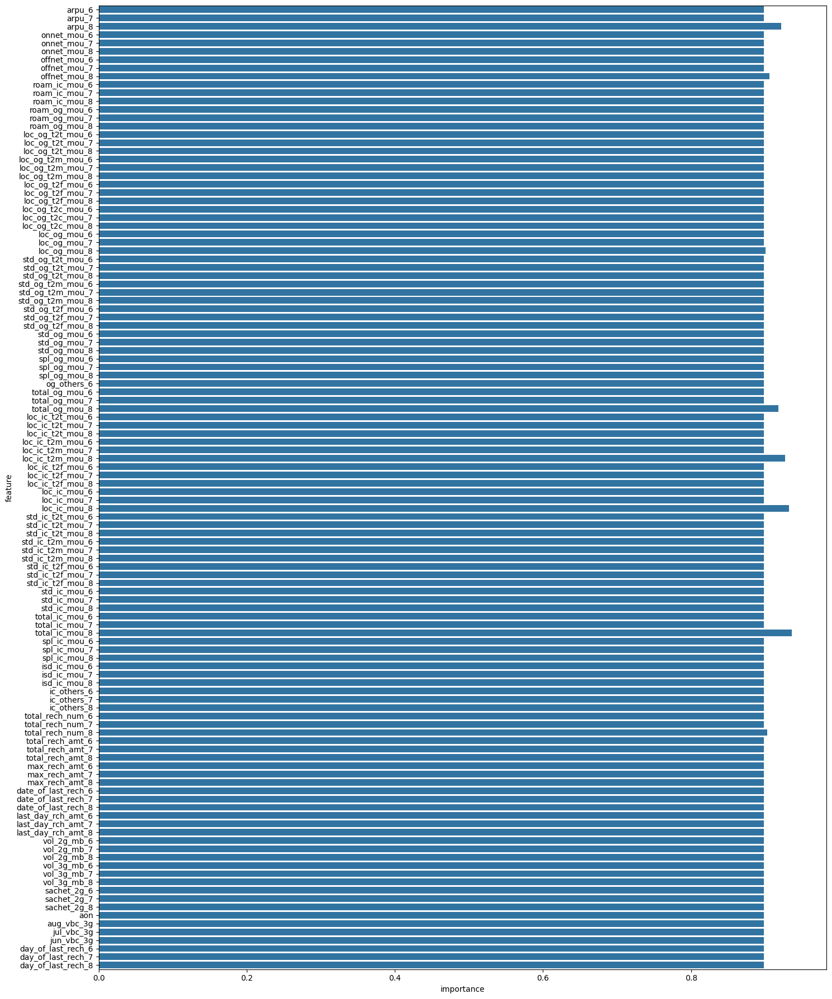

In [78]:
plt.figure(figsize=(15,18))
sns.barplot(y=f_imp_scores.sort_values('feature', ascending=False)['feature'], x=f_imp_scores['importance'], orient='h')
plt.tight_layout()

In [61]:
# code gotten from https://towardsdatascience.com/best-practice-to-calculate-and-interpret-model-feature-importance-14f0e11ee660
from sklearn.inspection import permutation_importance
forest = RandomForestClassifier(n_estimators=100, min_samples_leaf=20, n_jobs=-1, oob_score=True, random_state=42).fit(X_train, y_train)



In [66]:
perm_imp_train = permutation_importance(forest, X_train, y_train, n_repeats=5, random_state=42, n_jobs=-1)
perm_imp_test = permutation_importance(forest, X_test, y_test, n_repeats=5, random_state=42, n_jobs=-1)

sorted_imp_idx_train = perm_imp_train.importances_mean.argsort()
sorted_imp_idx_test = perm_imp_test.importances_mean.argsort()



In [91]:
imp_df_train = pd.DataFrame(perm_imp_train.importances[sorted_imp_idx_train].T, columns=X_train.columns[sorted_imp_idx_train])
imp_df_test = pd.DataFrame(perm_imp_test.importances[sorted_imp_idx_test].T, columns=X_test.columns[sorted_imp_idx_test])

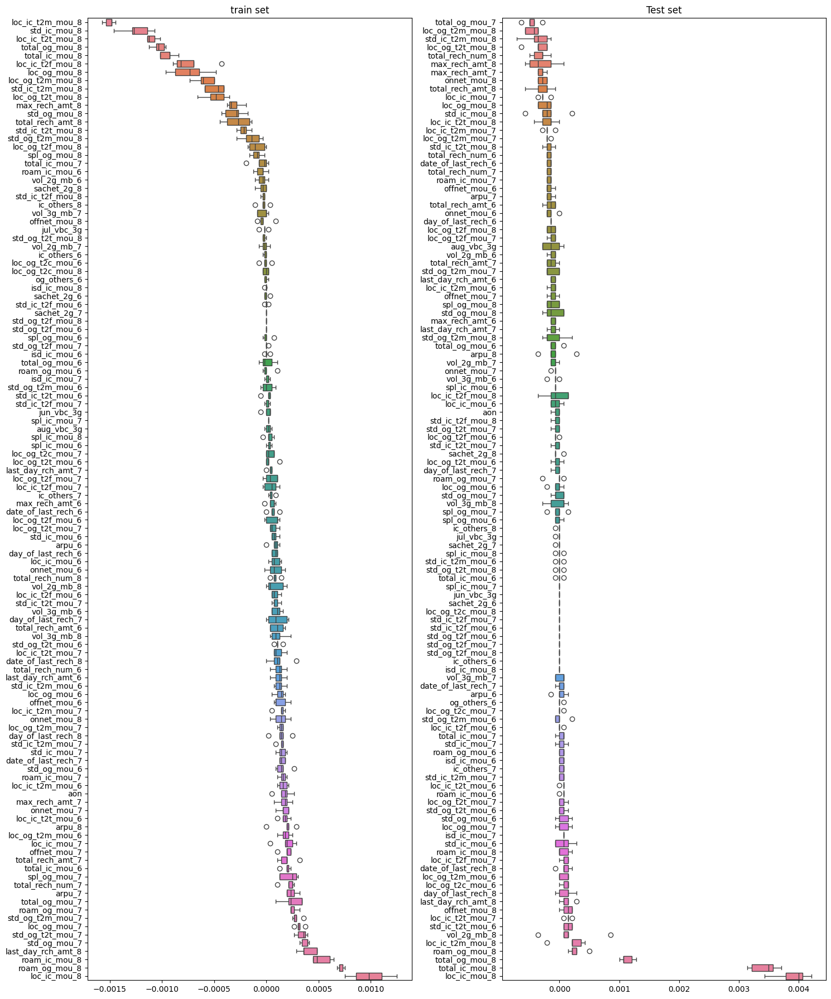

In [92]:
fig, axs = plt.subplots(1, 2, figsize=(15,18))
sns.boxplot(imp_df_train, orient='h', ax=axs[0])
axs[0].set_title('train set')
sns.boxplot(imp_df_test, orient='h', ax=axs[1])
axs[1].set_title('Test set')
plt.tight_layout()


In [7]:
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.datasets import make_classification
# from sklearn.inspection import permutation_importance
# import pandas as pd
# rf = RandomForestClassifier(
#          n_estimators=100,
#          n_jobs=-1,
#          min_samples_leaf = 20,
#          oob_score=True,
#          random_state = 42)
# X, y = make_classification(n_samples=1000, n_features=10, n_informative=3, random_state=0)
# forest = RandomForestClassifier(n_estimators=100, min_samples_leaf=20, n_jobs=-1, random_state=42).fit(X, y)
# # print(forest.feature_importances_)
# # feat_importances = pd.Series(forest.feature_importances_, index = range(1,11)).sort_values(ascending = True)
# # feat_importances.plot(kind = 'barh')

# perm_importance = permutation_importance(forest, X, y, n_repeats=20, random_state=42, n_jobs=2)
# print(perm_importance)
# # perm_importance.importances_mean
# # display(pd.DataFrame(perm_importance['importances_mean']))
# # display(pd.DataFrame(perm_importance['importances']))

{'importances_mean': array([0.24155, 0.08045, 0.08285, 0.0029 , 0.1177 , 0.0023 , 0.00445,
       0.004  , 0.0013 , 0.10615]), 'importances_std': array([0.01044258, 0.00582645, 0.00626319, 0.00104403, 0.0076818 ,
       0.0009    , 0.00111692, 0.00094868, 0.0009    , 0.00686495]), 'importances': array([[0.234, 0.239, 0.237, 0.24 , 0.248, 0.221, 0.236, 0.241, 0.245,
        0.239, 0.251, 0.253, 0.237, 0.235, 0.272, 0.249, 0.25 , 0.227,
        0.241, 0.236],
       [0.086, 0.08 , 0.082, 0.078, 0.085, 0.085, 0.076, 0.069, 0.075,
        0.091, 0.085, 0.082, 0.066, 0.085, 0.079, 0.081, 0.082, 0.083,
        0.084, 0.075],
       [0.078, 0.089, 0.083, 0.076, 0.085, 0.078, 0.084, 0.08 , 0.072,
        0.087, 0.074, 0.086, 0.086, 0.075, 0.082, 0.079, 0.098, 0.09 ,
        0.086, 0.089],
       [0.004, 0.004, 0.004, 0.001, 0.004, 0.002, 0.002, 0.003, 0.002,
        0.002, 0.004, 0.004, 0.002, 0.002, 0.004, 0.002, 0.002, 0.002,
        0.004, 0.004],
       [0.122, 0.136, 0.124, 0.113, 0.124, 

In [ ]:
# from sklearn.preprocessing import MinMaxScaler
# scaler = MinMaxScaler()

# print('Before feature scaling: ')
# display(X_train.describe().style)

# X_train_cols = X_train.columns
# X_train.loc[:,~X_train.columns.isin(date_cols)] = scaler.fit_transform(X_train.loc[:,~X_train.columns.isin(date_cols)])
# # df_scaled = pd.DataFrame(X_train, columns=X_train_cols)

# print('After feature scaling: ')
# display(X_train.describe().style)



before feature scaling: 


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,day_of_last_rech_6,month_of_last_rech_6,days_from_baseline_last_rech_6,day_of_last_rech_7,month_of_last_rech_7,days_from_baseline_last_rech_7,day_of_last_rech_8,month_of_last_rech_8,days_from_baseline_last_rech_8
count,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,53781.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,53781.000000,53871.000000,53066.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000
mean,282.960366,278.228962,278.176909,127.379717,128.965777,126.130856,191.552249,190.552330,185.920897,9.347481,6.768854,6.501651,13.758839,9.500966,9.233788,44.446151,44.003588,42.991991,89.746720,87.780840,86.248256,3.608821,3.632031,3.472175,1.090496,1.310739,1.346861,137.808709,135.423526,132.719328,77.484210,81.181199,79.577267,84.938571,88.503483,85.632435,1.075681,1.036766,0.990184,163.501086,170.724041,166.202388,3.820109,4.830491,4.809844,0.471620,306.361244,311.727919,304.507872,46.294546,46.058879,45.059387,102.98

after feature scaling: 


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,day_of_last_rech_6,month_of_last_rech_6,days_from_baseline_last_rech_6,day_of_last_rech_7,month_of_last_rech_7,days_from_baseline_last_rech_7,day_of_last_rech_8,month_of_last_rech_8,days_from_baseline_last_rech_8
count,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,53781.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,53781.000000,53871.000000,53066.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000,55999.000000
mean,0.143222,0.086734,0.038900,0.017268,0.015809,0.011730,0.022906,0.027052,0.023661,0.003279,0.001629,0.002243,0.003645,0.003379,0.001730,0.006911,0.005946,0.003998,0.019108,0.019262,0.017384,0.005843,0.004455,0.005902,0.003244,0.001431,0.003828,0.012948,0.017645,0.012022,0.010518,0.009981,0.009929,0.010215,0.013364,0.011404,0.001711,0.002665,0.003116,0.019388,0.020934,0.020433,0.003733,0.002036,0.005039,0.000589,0.028702,0.037623,0.027565,0.008709,0.004939,0.004213,0.023139,0.023082,0.016328,0.006196,0.006122,0.006655,0.02

In [ ]:
# sns.countplot(data['spl_ic_mou_7'])
# plt.show()

# sns.kdeplot(data['spl_ic_mou_7'])
# plt.show()
# # data['spl_ic_mou_7'].size
# # sns.kdeplot(data['spl_ic_mou_7'], multiple="fill")

KeyboardInterrupt: 

#### Analyze outliers
